# Visualizing ENACT Outputs
This notebook provides a comprehensive, step-by-step guide on how to access and analyze output data from ENACT. The notebook covers the following topics:

- **Loading the AnnData object in Python**  
  Learn how to load the main data structure for single-cell analysis.

- **Extracting cell types and their spatial coordinates**  
  Access information about cell types and their positions in the tissue.

- **Determining the number of shared and unique bins per cell**  
  Explore metrics that characterize the bin and cell relationships.

- **Accessing and visualizing the number of transcripts per cell**  
  Visualize and analyze transcriptional activity across cells.

- **Identifying the top-n expressed genes in the sample**  
  Retrieve the most highly expressed genes in your dataset.

- **Generating interactive plots**  
  Visualize cell boundaries and cell types within the tissue using interactive visualizations.

- **Performing downstream analysis**  
  Run a sample analysis, such as neighborhood enrichment analysis, using external packages like **Squidpy**.

This notebook serves as a helpful resource for navigating and analyzing ENACT output data effectively.

## Install required packages 

In [1]:
# Uncomment to install the required packages
# !pip install numpy pandas matplotlib plotly anndata scanpy pillow tifffile

## Import Required Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import anndata as ad
import scanpy as sc
from PIL import Image
import tifffile as tifi
from IPython.display import IFrame

## Locate the output files
Replace the following paths with your file paths

File path template:
- Anndata object: "/<cache_dir>/<analysis_name>/tmap/<bin_to_cell_method>|<cell_annotation_method>_cells_adata.h5"
- Whole slide image: "/<cache_dir>/<analysis_name>/tmap/wsi.tif"
- Cell boundaries picture = "/<cache_dir>/<analysis_name>/cells_layer.png"

In [3]:
# Anndata object path
cells_adata_path = "/home/oneai/oneai-dda-spatialtr-visiumhd_analysis/cache/colon-test/tmap/naive|celltypist_cells_adata.h5"

# Cropped whole slide image
wsi_path = "/home/oneai/oneai-dda-spatialtr-visiumhd_analysis/cache/colon-test/tmap/wsi.tif"

# Cell boundaries image
cells_layer_path = "/home/oneai/oneai-dda-spatialtr-visiumhd_analysis/cache/colon-test/cells_layer.png"

## Loading the AnnData object in Python
Learn how to load the main data structure for single-cell analysis.

In [4]:
# Loading Anndata object
adata = sc.read_h5ad(cells_adata_path)

## Getting cell types
Anndata 'obs' entry contains the following information about the cell:
- 'cell_type' column: type assigned to each cell
- 'patch_id' column: the parent patch/ chunk the cell belongs to

In [5]:
adata.obs

,cell_type,patch_id
id,,
ID_203266,enteric glial cells,patch_3_4.csv
ID_203292,cms2,patch_3_4.csv
ID_203297,cms2,patch_3_4.csv
ID_203322,cms2,patch_3_4.csv
ID_203330,stromal 1,patch_3_4.csv
...,...,...
ID_71691,cms2,patch_4_1.csv
ID_71692,cms2,patch_4_1.csv
ID_71694,cms2,patch_4_1.csv


## Getting distribution of cell types

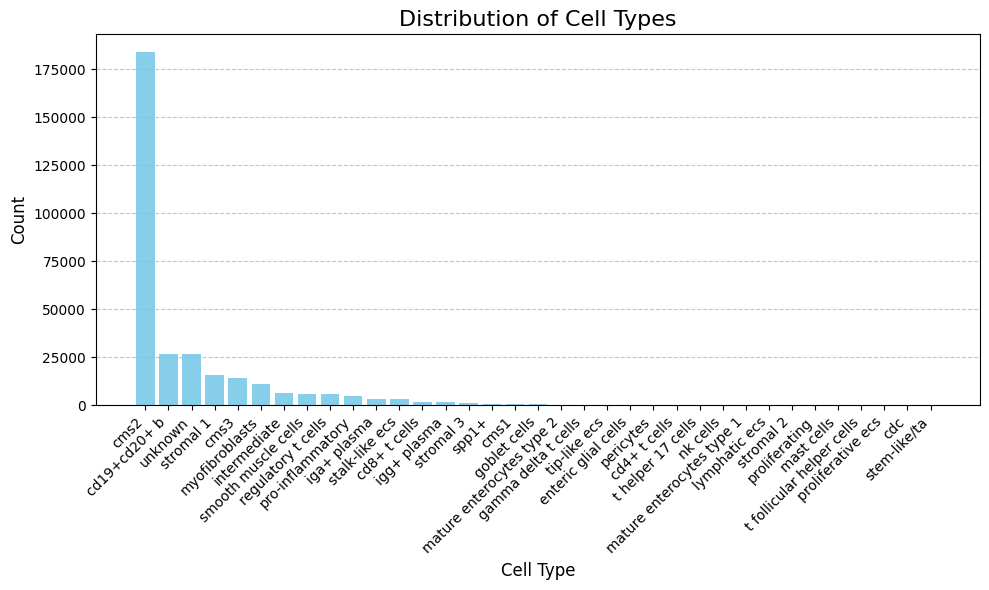

In [6]:
cell_type_counts = adata.obs["cell_type"].value_counts().reset_index()
cell_type_counts.columns = ["Cell Type", "Count"]

# Create the plot
plt.figure(figsize=(10, 6))
plt.bar(cell_type_counts["Cell Type"], cell_type_counts["Count"], color='skyblue')
plt.title("Distribution of Cell Types", fontsize=16)
plt.xlabel("Cell Type", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

## Plotting Cell Stastics

The cell statistics are accessible via adata.obsm["stats"]

In [7]:
adata.obsm["stats"]

,num_shared_bins,num_unique_bins,num_transcripts
id,,,
ID_203266,14,18,96
ID_203292,22,12,15
ID_203297,16,32,38
ID_203322,18,8,131
ID_203330,15,12,13
...,...,...,...
ID_71691,13,5,6
ID_71692,13,4,0
ID_71694,16,5,2


Plotting number of shared bins per cell, number of unique bins per cell, and number of transcripts per cell.

*Note: In the figures below, each dot is a cell*


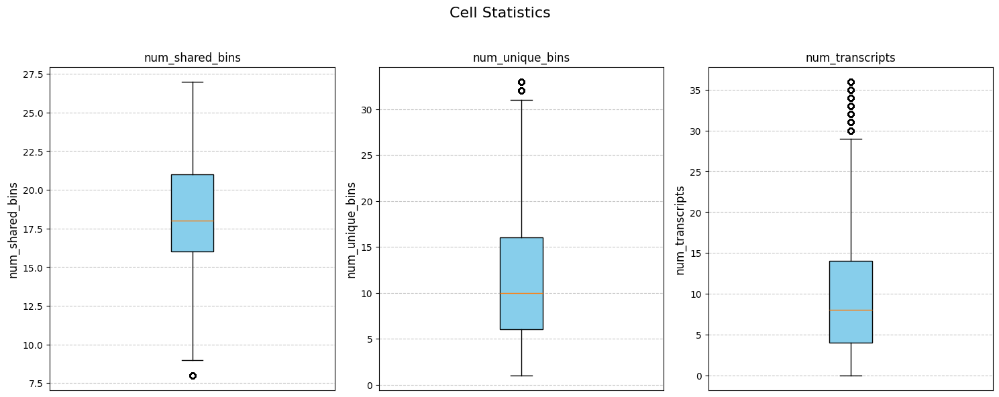

In [8]:
# Extract the stats DataFrame from adata
stats_df = adata.obsm["stats"]

# Function to remove outliers using IQR
def remove_outliers(series):
    q1 = series.quantile(0.25)  # First quartile (25th percentile)
    q3 = series.quantile(0.75)  # Third quartile (75th percentile)
    iqr = q3 - q1  # Interquartile range
    lower_bound = q1 - 1.5 * iqr  # Lower bound
    upper_bound = q3 + 1.5 * iqr  # Upper bound
    return series[(series >= lower_bound) & (series <= upper_bound)]

# Remove outliers from the DataFrame
filtered_stats_df = stats_df.apply(remove_outliers)

# Create subplots: one subplot for each column
num_columns = len(filtered_stats_df.columns)
fig, axes = plt.subplots(1, num_columns, figsize=(15, 6), sharey=False)
for i, column in enumerate(filtered_stats_df.columns):
    axes[i].boxplot(filtered_stats_df[column].dropna(), patch_artist=True, boxprops=dict(facecolor="skyblue"))
    axes[i].set_title(column, fontsize=12)
    axes[i].set_xticks([])
    axes[i].grid(axis="y", linestyle="--", alpha=0.7)
    axes[i].set_ylabel(column, fontsize=12)
fig.suptitle("Cell Statistics", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for the title


# Show the plot
plt.show()

## Getting cell coordinates
Cell centroid coordinates are accessible via adata.obsm["spatial"]

In [9]:
adata.obsm["spatial"]

,cell_x,cell_y
id,,
ID_203266,14200,16288
ID_203292,14181,16219
ID_203297,13858,16310
ID_203322,13542,16327
ID_203330,12286,16191
...,...,...
ID_71691,19057,5553
ID_71692,19952,5040
ID_71694,17801,6673


## Plotting the top-n expressed genes

Plotting the top-n genes by count (summed across all cells)

*Note: ENACT only keeps the top-k highly variable genes in the AnnData object if params>use_hvg is set to True.*

Number of unique genes in the sample: 1089


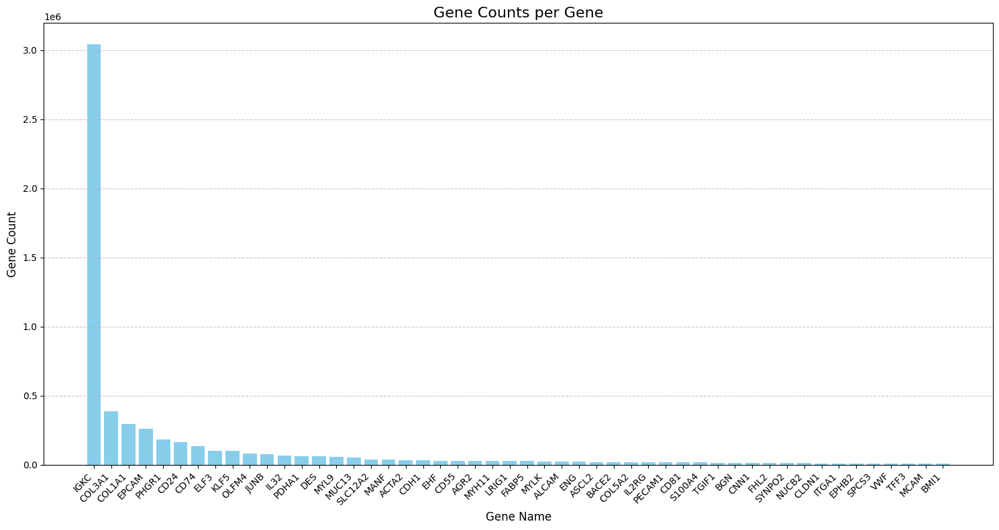

In [10]:
top_n = 50  # Adjust the number of genes to display

# Compute gene counts
counts_per_gene = (
    pd.DataFrame({"Gene Name": adata.var_names, "Gene Count": adata.X.sum(axis=0)})
    .sort_values(by="Gene Count", ascending=False)
)
print(f"Number of unique genes in the sample: {len(counts_per_gene)}")

# Select the top N genes
top_genes = counts_per_gene[:top_n]

# Create the plot
plt.figure(figsize=(15, 8))
plt.bar(top_genes["Gene Name"], top_genes["Gene Count"], color="skyblue")
plt.title("Gene Counts per Gene", fontsize=16)
plt.xlabel("Gene Name", fontsize=12)
plt.ylabel("Gene Count", fontsize=12)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


## Visualizing cell types over the image

Get an image patch to visualize

Patch bounds: x_min, x_max, y_min, y_max = (5000, 6000, 5000, 6000)


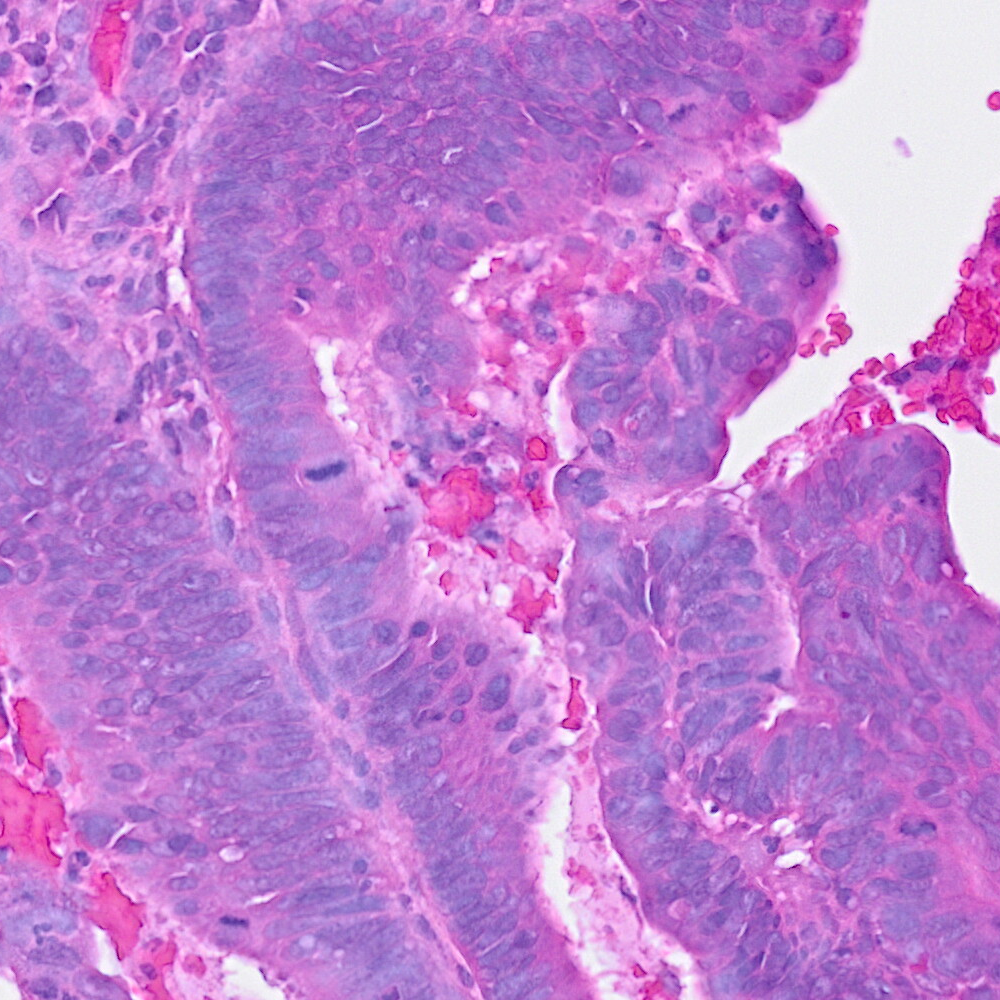

In [11]:
x_start, y_start = 5000, 5000  # Top-left corner of the patch
patch_size = 1000 # Specify the patch size

Image.MAX_IMAGE_PIXELS = None
wsi_img = tifi.imread(wsi_path)
cells_layer = np.array(Image.open(cells_layer_path))
x_min, x_max, y_min, y_max = (x_start, x_start + patch_size, y_start, y_start + patch_size)
patch = wsi_img[y_min:y_max, x_min:x_max]
patch_boundaries = cells_layer[y_min:y_max, x_min:x_max]
# Convert the NumPy array to a PIL Image
patch_image = Image.fromarray(patch)
print(f"Patch bounds: x_min, x_max, y_min, y_max = {x_min, x_max, y_min, y_max}")
patch_image

Get the cells within a patch and represent their coordinates in the patch frame of reference.

In [12]:
patch_adata = adata[
    adata.obsm["spatial"].cell_x.between(x_min, x_max) & 
    adata.obsm["spatial"].cell_y.between(y_min, y_max)
    ]
patch_cell_coords = patch_adata.obsm["spatial"]
print (f"Number of cells in patch: {patch_cell_coords.shape[0]}")

# Adjust coordinates relative to the patch
patch_cell_coords_df = patch_cell_coords.copy()
patch_cell_coords_df["cell_x_relative"] = patch_cell_coords_df["cell_x"] - x_start
patch_cell_coords_df["cell_y_relative"] = patch_cell_coords_df["cell_y"] - y_start
patch_cell_coords_df["cell_type"] = patch_adata.obs["cell_type"]
patch_cell_coords_df

Number of cells in patch: 910


,cell_x,cell_y,cell_x_relative,cell_y_relative,cell_type
id,,,,,
ID_30563,5586,5412,586,412,cms2
ID_30567,5832,5049,832,49,cms3
ID_30578,5361,5254,361,254,cms2
ID_30582,5001,5573,1,573,cms3
ID_30624,5349,5215,349,215,cms2
...,...,...,...,...,...
ID_38965,5839,5660,839,660,cd19+cd20+ b
ID_38980,5755,5655,755,655,cms2
ID_39002,5768,5995,768,995,cms2


Visualize cell segmentation boundaries and cell types within patch

In [13]:
def plot_image_with_cell_overlays(
    patch, 
    patch_boundaries, 
    patch_cell_coords_df, 
    patch_size, 
    alpha=0.6, 
    colormap=plt.cm.tab10
):
    """
    Plots an image patch with overlaid cell coordinates color-coded by cell type.

    Parameters:
        patch (np.ndarray): The base image patch (2D or 3D array).
        patch_boundaries (np.ndarray): The boundary mask image to overlay.
        patch_cell_coords_df (pd.DataFrame): DataFrame with columns 'cell_x_relative', 
                                             'cell_y_relative', and 'cell_type'.
        patch_size (int): The size of the patch (assumes square images).
        alpha (float): Transparency for blending patch and boundaries (0-1).
        colormap: Matplotlib colormap to assign colors to cell types.
    """
    # Normalize images to [0, 1]
    patch_norm = patch / 255.0
    patch_boundaries_norm = patch_boundaries / 255.0

    # Blend the images
    overlay_image = (1 - alpha) * patch_norm + alpha * patch_boundaries_norm

    # Generate colors for unique cell types
    cell_type_colors = {
        cell_type: f"rgb({r*255:.0f}, {g*255:.0f}, {b*255:.0f})"
        for cell_type, (r, g, b) in zip(patch_cell_coords_df["cell_type"].unique(), colormap.colors)
    }

    # Assign colors to each cell type
    patch_cell_coords_df["color"] = patch_cell_coords_df["cell_type"].map(cell_type_colors)

    # Create a Plotly figure
    fig = go.Figure()

    # Add the image as a background
    fig.add_layout_image(
        dict(
            source=Image.fromarray((overlay_image * 255).astype(np.uint8)),  # Convert to PIL image
            x=0,
            y=patch_size,
            xref="x",
            yref="y",
            sizex=patch_size,
            sizey=patch_size,
            xanchor="left",
            yanchor="top",
            layer="below",
        )
    )

    # Add scatter points for the coordinates
    fig.add_trace(
        go.Scatter(
            x=patch_cell_coords_df["cell_x_relative"],
            y=patch_size - patch_cell_coords_df["cell_y_relative"],  # Invert y-axis
            mode="markers",
            marker=dict(
                color=patch_cell_coords_df["color"],  # Color-coding by cell type
                size=10,
            ),
            name="Coordinates",
            hoverinfo='text',
            text=patch_cell_coords_df['cell_type'],  # Hover displays cell type
        )
    )

    # Set axis properties to match the image size and fix zoom alignment
    fig.update_xaxes(
        range=[0, patch_size], 
        visible=False,
        scaleanchor="y",
    )
    fig.update_yaxes(
        range=[0, patch_size], 
        visible=False,
        scaleanchor="x",
    )

    # Update layout to remove padding and ensure consistent scaling
    fig.update_layout(
        title="Image Patch with Cell Overlays",
        height=1000,
        width=1000,
        margin=dict(l=0, r=0, t=0, b=0),  # No margin
    )

    return fig

fig = plot_image_with_cell_overlays(patch, patch_boundaries, patch_cell_coords_df, patch_size)
fig.show()

html_file_path = "sample_enact_output.html"
fig.write_html(html_file_path)

# Display the HTML file in an iframe
IFrame(src=html_file_path, width='100%', height=600)

[View Interactive Plot](sample_enact_output.html)

## Running Spatial Analysis on ENACT Output

Squidpy can be used to compute various downstream analysis, for example: Neighborhood enrichment analysis

### Neighborhood enrichment analysis

This generates a clustergram of Z-scores. This test helps to identify cell types that
have a similar neighborhood structure within a given tissue. The test accomplishes this by
comparing the number of connections between two cell types in a graph to a random permutation
of objects. If two distinct cell types are found in close proximity to each other, the test
assigns a high Z-score, indicating that the cell types are enriched. Conversely, if the
two cell types are far apart, the test assigns a low Z-score, indicating that they are
depleted.

/home/oneai/envs/enact_py_env/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning:

nopython is set for njit and is ignored

/home/oneai/envs/enact_py_env/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning:

Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.

100%|██████████| 1000/1000 [00:00<00:00, 4108.29/s]
/home/oneai/envs/enact_py_env/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning:

invalid value encountered in divide



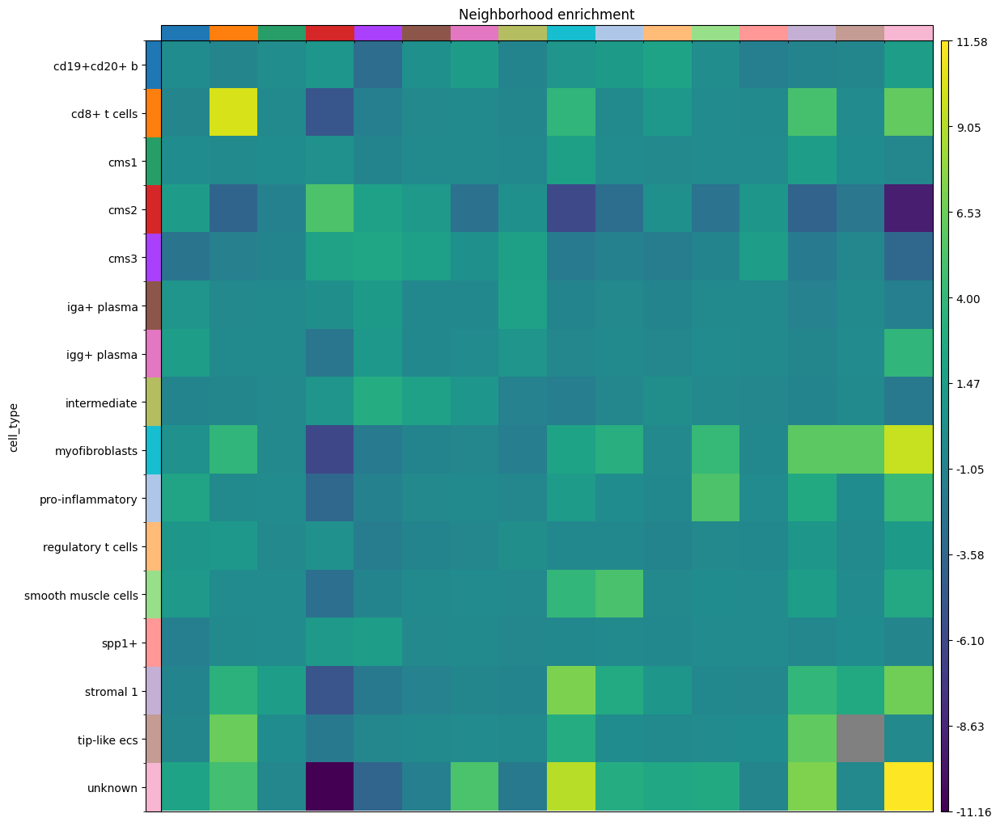

In [14]:
# !pip install squidpy
import squidpy as sq

def run_neighborhood_enrichment(adata):
    """Sample function to run Squidpy operations on AnnData object

    Args:
        adata (_type_): _description_

    Returns:
        _type_: _description_
    """
    sq.gr.spatial_neighbors(adata)
    sq.gr.nhood_enrichment(adata, cluster_key="cell_type")
    return adata

# Reference documentation: https://squidpy.readthedocs.io/en/stable/api/squidpy.pl.nhood_enrichment.html
run_neighborhood_enrichment(patch_adata)
sq.pl.nhood_enrichment(patch_adata, cluster_key="cell_type")